# Telecom Churn Case Study

## Business Objective

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

## Data Preparation

### 1. Univariate Data analysis impute missing values and dropping columns
### 2. Derive new features
### 3. Filter high-value customers
### 4. Tag churners and remove attributes of the churn phase
### 4. Treat data imbalance using SMOTE technique 

## Modelling

## PCA
### 1. Principal Components 
### 2. Apply Logistic Regression 
### 3. Apply xgboost 

## Without PCA
### 1. Apply Logistic Regression 
### 2. Apply SVC on the data 
### 3. Apply xgboost on the data 
### 4. Apply Decision tree model 
### 5. Apply Random Forest model 
### 6. Ensemble all four modelsusing average
### 7. Ensemble all four modelsusing weighted average

# Import all necessary library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,GridSearchCV,KFold
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score
from imblearn.metrics import sensitivity_specificity_support
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from IPython.display import Image
from scipy.optimize import minimize,differential_evolution
import warnings
warnings.filterwarnings("ignore")
import xgboost as xgb
import statsmodels.api as stats
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
import copy

# Data understanding, preparation, and feature engineering 

### Loading data to data frame

In [2]:
telecom_data_df = pd.read_csv('telecom_churn_data.csv')

# Remove all columns where we have 70% missing values

In [3]:
for col in telecom_data_df.columns:
    if telecom_data_df[col].isnull().sum()/telecom_data_df.shape[0] > 0.7:
        telecom_data_df.drop(col,axis = 1,inplace=True)

In [4]:
telecom_data_df

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,0,0,0,0,968,30.40,0.00,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,0,0,0,0,1006,0.00,0.00,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,0,0,0,0,1103,0.00,0.00,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,0,0,0,0,2491,0.00,0.00,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0,0,0,0,1526,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,7001548952,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,18.471,...,0,0,0,0,0,3199,0.00,0.00,0.00,0.00
99995,7000607688,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,112.201,...,0,0,0,0,0,2052,0.00,0.00,0.00,0.00
99996,7000087541,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,229.187,...,0,0,0,0,0,185,0.00,0.00,0.00,0.00
99997,7000498689,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,322.991,...,4,1,0,0,0,478,1445.74,1151.03,1173.18,0.00


## Update all abbribiation with actual text to better understand the column data

### Created the dictionary with all abbrebiation 

In [5]:
data_dict = {"MOBILE_NUMBER":"Customer phone number",
"CIRCLE_ID":"Telecom circle area to which the customer belongs to",
"LOC":"Local calls - within same telecom circle",
"STD":"STD calls - outside the calling circle",
"IC":"Incoming calls",
"OG":"Outgoing calls",
"T2T":"Operator T to T, i.e. within same operator (mobile to mobile)",
"T2M":"Operator T to other operator mobile",
"T2O":"Operator T to other operator fixed line",
"T2F":"Operator T to fixed lines of T",
"T2C":"Operator T to it’s own call center",
"ARPU":"Average revenue per user",
"MOU":"Minutes of usage - voice calls",
"AON":"Age on network - number of days the customer is using the operator T network",
"ONNET":"All kind of calls within the same operator network",
"OFFNET":"All kind of calls outside the operator T network",
"ROAM":"Indicates that customer is in roaming zone during the call",
"SPL":"Special calls",
"ISD":"ISD calls",
"RECH":"Recharge",
"NUM":"Number",
"AMT":"Amount in local currency",
"MAX":"Maximum",
"DATA":"Mobile internet",
"3G":"3G network",
"AV":"Average",
"VOL":"Mobile internet usage volume (in MB)",
"2G":"2G network",
"PCK":"Prepaid service schemes called - PACKS",
"NIGHT":"Scheme to use during specific night hours only",
"MONTHLY":"Service schemes with validity equivalent to a month",
"SACHET":"Service schemes with validity smaller than a month",
"*.6":"KPI for the month of June",
"*.7":"KPI for the month of July",
"*.8":"KPI for the month of August",
"*.9":"KPI for the month of September",
"FB_USER":"Service scheme to avail services of Facebook and similar social networking sites",
"VBC":"Volume based cost - when no specific scheme is not purchased and paid as per usage",
}

### Getting the complete column description using the dictionary abbrebiation

In [6]:
final_dict = {}
for col in telecom_data_df.columns:    
    col = col.replace('_6','').replace('_7','').replace('_8','').replace('_9','')
    col_list = col.split('_')
    s = ''
    for c in col_list:
        s  += data_dict.get(c.upper(),c) + ' '    
    final_dict[col] = s
# for k,v in final_dict.items():
#     print(k,':',v)
pd.option_context('display.max_colwidth', 4000)
pd.set_option("max_rows", 65)
pd.DataFrame(final_dict.values(),final_dict.keys()).reset_index()

,index,0
0,mobile_number,mobile number
1,circle_id,circle id
2,loc_og_t2o_mou,Local calls - within same telecom circle Outgo...
3,std_og_t2o_mou,STD calls - outside the calling circle Outgoin...
4,loc_ic_t2o_mou,Local calls - within same telecom circle Incom...
5,last_date_of_month,last date of month
6,arpu,Average revenue per user
7,onnet_mou,All kind of calls within the same operator net...
8,offnet_mou,All kind of calls outside the operator T netwo...
9,roam_ic_mou,Indicates that customer is in roaming zone dur...


### 2. Filter high-value customers

As mentioned above, you need to predict churn only for the high-value customers. Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

In [7]:
telecom_data_df['avg_rech_amt_6_7'] = (telecom_data_df['total_rech_amt_6'] + telecom_data_df['total_rech_amt_7'])/2

In [8]:
telecom_data_df['avg_rech_amt_6_7'].describe()

count    99999.000000
mean       325.238792
std        370.833466
min          0.000000
25%        115.000000
50%        229.000000
75%        419.000000
max      37762.500000
Name: avg_rech_amt_6_7, dtype: float64

### Getting High value customer when average amount is greate than 70 percentile

In [9]:
telecom_data_df = telecom_data_df[telecom_data_df['avg_rech_amt_6_7'] > np.quantile(telecom_data_df['avg_rech_amt_6_7'],0.7)]

In [10]:
telecom_data_df.drop('avg_rech_amt_6_7',axis=1,inplace=True)

In [11]:
len(telecom_data_df)

29979

# Analyze Average Revenue per user

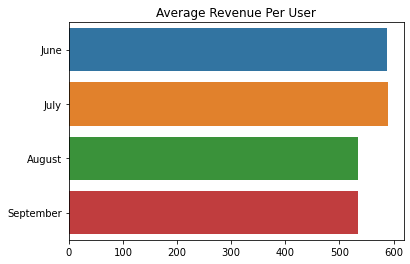

In [12]:
sns.barplot(telecom_data_df[['arpu_6','arpu_7','arpu_8','arpu_8']].mean(),['June','July','August','September'])
plt.title('Average Revenue Per User')
plt.show()

June - july (Good Phase) average Revenue per user is almost same and it is getting little bit low in Aug and Sep.

## Creating Target variable churn based upon columns (total_ic_mou_9, total_og_mou_9, vol_2g_mb_9, vol_3g_mb_9)

### Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. 

In [13]:
telecom_data_df['churn'] = telecom_data_df['total_ic_mou_9'] + telecom_data_df['total_og_mou_9'] + telecom_data_df['vol_2g_mb_9'] + telecom_data_df['vol_3g_mb_9']
telecom_data_df['churn'] = telecom_data_df['churn'].apply(lambda x : 1 if x == 0 else 0)

### Let's check the distributions of Target variable

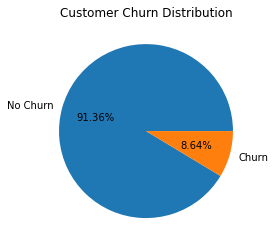

In [14]:
plt.pie(list(telecom_data_df['churn'].value_counts()),labels=['No Churn','Churn'],autopct = "%.2f%%")
plt.title('Customer Churn Distribution')
plt.show()

Only 8.64% are churning customer so we have data imbalanace, so need to treat this properly

### As we have already created churn column based upon 9th month data, removing all columns for 9th month.

In [15]:
# Dropping columns from churn pahse as we will not have this data once customer churned
for col in telecom_data_df.columns:
    if '_9' in col:
        telecom_data_df.drop(col,axis=1,inplace=True)

# Univariate Analysis

## Treating and Analyzing Missing Values 

### Filling last_date_of_month for 7th and 8th month for missing values with 7/31/2014 for July and 8/31/2014 for Aug

In [16]:
telecom_data_df['last_date_of_month_7'].fillna('7/31/2014',inplace=True)
telecom_data_df['last_date_of_month_8'].fillna('8/31/2014',inplace=True)

### Visualize the unique values in each columns 

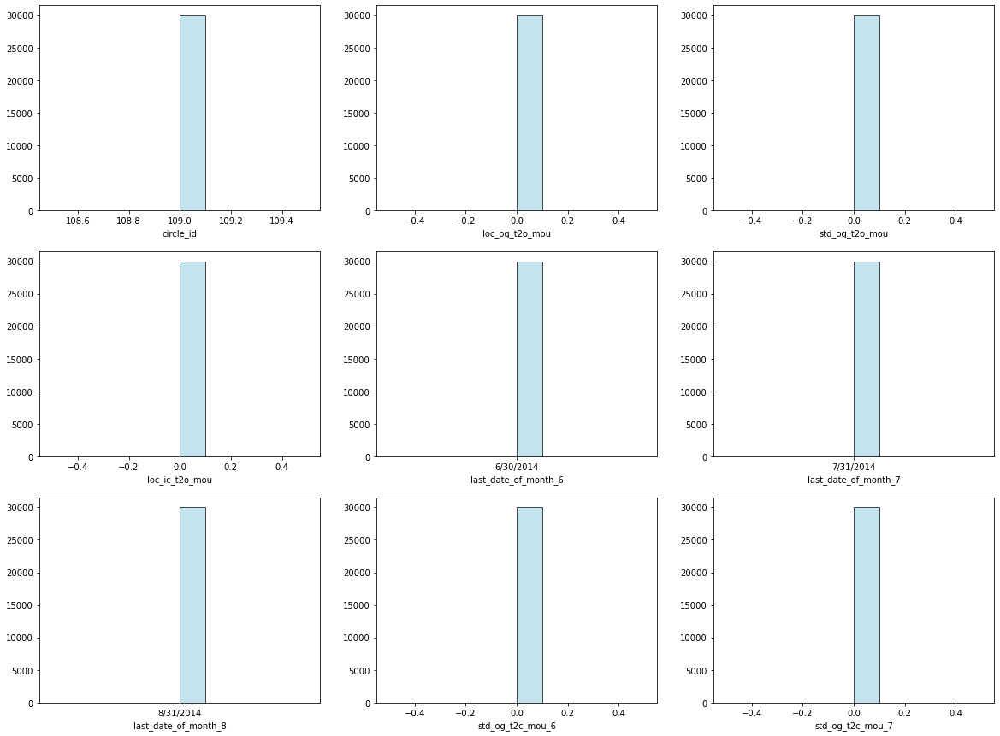

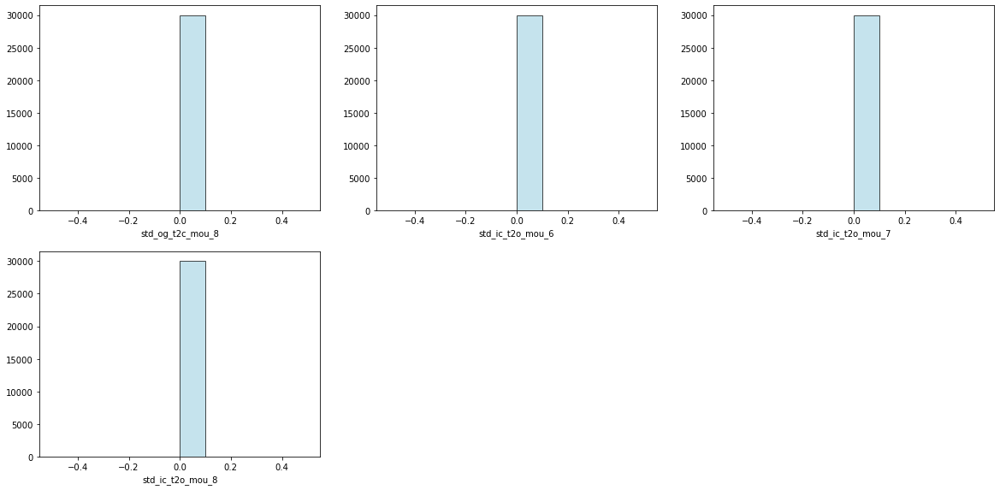

In [17]:
i=1  
for col in telecom_data_df.columns:
    if telecom_data_df[col].nunique() == 1:
        if i==1:
            plt.figure(figsize= (20,15))
        plt.subplot(3,3,i)        
        plt.hist(telecom_data_df[col].fillna(0) , color='lightblue', edgecolor = 'black', alpha = 0.7)        
        plt.xlabel(col)
        i=i+1
        if i>9:
            i=1

## Drop all the columns where we have single value
### Dropping all columns which are having single value as it is not useful for analysis

In [18]:
for col in telecom_data_df.columns:
    if telecom_data_df[col].nunique() == 1:
        print('Dropping column : ',col )
        telecom_data_df.drop(col,axis=1,inplace=True)

Dropping column :  circle_id
Dropping column :  loc_og_t2o_mou
Dropping column :  std_og_t2o_mou
Dropping column :  loc_ic_t2o_mou
Dropping column :  last_date_of_month_6
Dropping column :  last_date_of_month_7
Dropping column :  last_date_of_month_8
Dropping column :  std_og_t2c_mou_6
Dropping column :  std_og_t2c_mou_7
Dropping column :  std_og_t2c_mou_8
Dropping column :  std_ic_t2o_mou_6
Dropping column :  std_ic_t2o_mou_7
Dropping column :  std_ic_t2o_mou_8


# Creating Derived features

###  Filling missing last recharge date with minimum date of recharge from data set for all months. and then converting to date type. 
### Get the max recharge date and create derived columns days_from_last_rech to get no of days from last recharge 

In [19]:
telecom_data_df['date_of_last_rech_6'].fillna('5/31/2014',inplace=True)
telecom_data_df['date_of_last_rech_7'].fillna('5/31/2014',inplace=True)
telecom_data_df['date_of_last_rech_8'].fillna('5/31/2014',inplace=True)
telecom_data_df['date_of_last_rech_6'] = pd.to_datetime(telecom_data_df['date_of_last_rech_6'])
telecom_data_df['date_of_last_rech_7'] = pd.to_datetime(telecom_data_df['date_of_last_rech_7'])
telecom_data_df['date_of_last_rech_8'] = pd.to_datetime(telecom_data_df['date_of_last_rech_8'])
telecom_data_df["date_of_last_rech"] = telecom_data_df[["date_of_last_rech_6", "date_of_last_rech_7",'date_of_last_rech_7']].max(axis=1)
telecom_data_df.drop("date_of_last_rech_6",axis=1,inplace=True)
telecom_data_df.drop("date_of_last_rech_7",axis=1,inplace=True)
telecom_data_df.drop("date_of_last_rech_8",axis=1,inplace=True)
telecom_data_df["days_from_last_rech"] = (max(telecom_data_df["date_of_last_rech"]) - telecom_data_df["date_of_last_rech"]).dt.days
telecom_data_df.drop("date_of_last_rech",axis=1,inplace=True)

### Let's visualize the no of days recharge

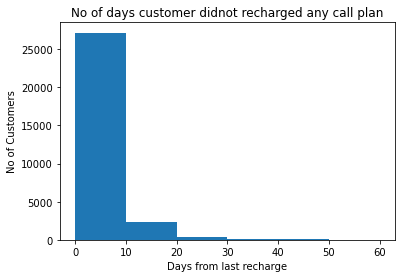

In [20]:
bins = [0,10,20,30,40,50,60]
plt.hist(telecom_data_df["days_from_last_rech"],bins=bins)
plt.title('No of days customer didnot recharged any call plan')
plt.xlabel('Days from last recharge')
plt.ylabel('No of Customers')
plt.show()

# mobile_number is a unique field so dropping this column so not adding any value to analysis

In [21]:
telecom_data_df.drop('mobile_number',axis = 1,inplace=True)

# Analysis for Minute of Usage for Incoming call

### We can see loc_ic_mou_6 column is sum of all local incoming calls minute of usage

In [22]:
telecom_data_df['calc_loc_ic_mou_6'] = telecom_data_df['loc_ic_t2m_mou_6'] + telecom_data_df['loc_ic_t2t_mou_6'] + telecom_data_df['loc_ic_t2f_mou_6']
telecom_data_df[['calc_loc_ic_mou_6','loc_ic_mou_6']]

,calc_loc_ic_mou_6,loc_ic_mou_6
7,427.86,427.88
8,81.42,81.43
13,215.57,215.58
16,276.85,276.86
17,81.95,81.96
...,...,...
99970,24.15,24.16
99974,100.44,100.44
99986,566.25,566.26
99988,307.30,307.31


### We can see std_ic_mou_6 column is sum of all std incoming calls minute of usage

In [23]:
telecom_data_df['calc_std_ic_mou_6'] = telecom_data_df['std_ic_t2m_mou_6'] + telecom_data_df['std_ic_t2t_mou_6'] + telecom_data_df['std_ic_t2f_mou_6']
telecom_data_df[['calc_std_ic_mou_6','std_ic_mou_6']]

,calc_std_ic_mou_6,std_ic_mou_6
7,180.52,180.54
8,22.43,22.43
13,423.81,423.81
16,87.98,87.99
17,9.91,9.91
...,...,...
99970,0.76,0.76
99974,17.36,17.36
99986,14.45,14.46
99988,691.43,691.44


### We can see total_ic_mou_6 column is sum of all all incoming calls minute of usage

In [24]:
telecom_data_df['calc_ic_mou_6'] = telecom_data_df['loc_ic_mou_6'] + telecom_data_df['std_ic_mou_6'] + telecom_data_df['spl_ic_mou_6'] + telecom_data_df['isd_ic_mou_6'] + telecom_data_df['roam_ic_mou_6']
telecom_data_df[['calc_ic_mou_6','total_ic_mou_6']]

,calc_ic_mou_6,total_ic_mou_6
7,626.92,626.46
8,103.86,103.86
13,908.65,968.61
16,364.85,364.86
17,91.87,91.88
...,...,...
99970,29.98,24.93
99974,117.80,117.81
99986,580.72,580.73
99988,998.75,998.96


### Filling all missing values with 0 for all features becasue we can assume if value not there it is 0

In [25]:
telecom_data_df.fillna(0,inplace=True)

# Deriving features based upon good phase

In [26]:
telecom_data_df['arpu_good_phase'] = (telecom_data_df.arpu_6 + telecom_data_df.arpu_7)/2
telecom_data_df.drop('arpu_6',axis = 1, inplace = True)
telecom_data_df.drop('arpu_7',axis = 1, inplace = True)

telecom_data_df['onnet_mou_good_phase'] =(telecom_data_df.onnet_mou_6 + telecom_data_df.onnet_mou_7)/2
telecom_data_df.drop('onnet_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('onnet_mou_7',axis = 1, inplace = True)

telecom_data_df['offnet_mou_good_phase'] = (telecom_data_df.offnet_mou_6 + telecom_data_df.offnet_mou_7)/2
telecom_data_df.drop('offnet_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('offnet_mou_7',axis = 1, inplace = True)

telecom_data_df['roam_ic_mou_good_phase'] = (telecom_data_df.roam_ic_mou_6 + telecom_data_df.roam_ic_mou_7)/2
telecom_data_df.drop('roam_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('roam_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['roam_og_mou_good_phase'] = (telecom_data_df.roam_og_mou_6 + telecom_data_df.roam_og_mou_7)/2
telecom_data_df.drop('roam_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('roam_og_mou_7',axis = 1, inplace = True)

telecom_data_df['loc_og_mou_good_phase'] = (telecom_data_df.loc_og_mou_6 + telecom_data_df.loc_og_mou_7)/2
telecom_data_df.drop('loc_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_og_mou_7',axis = 1, inplace = True)

telecom_data_df['std_og_mou_good_phase'] = (telecom_data_df.std_og_mou_6 + telecom_data_df.std_og_mou_7)/2
telecom_data_df.drop('std_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('std_og_mou_7',axis = 1, inplace = True)

telecom_data_df['isd_og_mou_good_phase'] = (telecom_data_df.isd_og_mou_6 + telecom_data_df.isd_og_mou_7)/2
telecom_data_df.drop('isd_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('isd_og_mou_7',axis = 1, inplace = True)

telecom_data_df['spl_og_mou_good_phase'] = (telecom_data_df.spl_og_mou_6 + telecom_data_df.spl_og_mou_7)/2
telecom_data_df.drop('spl_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('spl_og_mou_7',axis = 1, inplace = True)

telecom_data_df['total_og_mou_good_phase'] = (telecom_data_df.total_og_mou_6 + telecom_data_df.total_og_mou_7)/2
telecom_data_df.drop('total_og_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('total_og_mou_7',axis = 1, inplace = True)

telecom_data_df['loc_ic_mou_good_phase'] = (telecom_data_df.loc_ic_mou_6 + telecom_data_df.loc_ic_mou_7)/2
telecom_data_df.drop('loc_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['std_ic_mou_good_phase'] = (telecom_data_df.std_ic_mou_6 + telecom_data_df.std_ic_mou_7)/2
telecom_data_df.drop('std_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('std_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['isd_ic_mou_good_phase'] = (telecom_data_df.isd_ic_mou_6 + telecom_data_df.isd_ic_mou_7)/2
telecom_data_df.drop('isd_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('isd_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['spl_ic_mou_good_phase'] = (telecom_data_df.spl_ic_mou_6 + telecom_data_df.spl_ic_mou_7)/2
telecom_data_df.drop('spl_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('spl_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['total_ic_mou_good_phase'] = (telecom_data_df.total_ic_mou_6 + telecom_data_df.total_ic_mou_7)/2
telecom_data_df.drop('total_ic_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('total_ic_mou_7',axis = 1, inplace = True)

telecom_data_df['total_rech_num_good_phase'] = (telecom_data_df.total_rech_num_6 + telecom_data_df.total_rech_num_7)/2
telecom_data_df.drop('total_rech_num_6',axis = 1, inplace = True)
telecom_data_df.drop('total_rech_num_7',axis = 1, inplace = True)

telecom_data_df['total_rech_amt_good_phase'] = (telecom_data_df.total_rech_amt_6 + telecom_data_df.total_rech_amt_7)/2
telecom_data_df.drop('total_rech_amt_6',axis = 1, inplace = True)
telecom_data_df.drop('total_rech_amt_7',axis = 1, inplace = True)

telecom_data_df['max_rech_amt_good_phase'] = (telecom_data_df.max_rech_amt_6 + telecom_data_df.max_rech_amt_7)/2
telecom_data_df.drop('max_rech_amt_6',axis = 1, inplace = True)
telecom_data_df.drop('max_rech_amt_7',axis = 1, inplace = True)


telecom_data_df['vol_2g_mb_good_phase'] = (telecom_data_df.vol_2g_mb_6 + telecom_data_df.vol_2g_mb_7)/2
telecom_data_df.drop('vol_2g_mb_6',axis = 1, inplace = True)
telecom_data_df.drop('vol_2g_mb_7',axis = 1, inplace = True)

telecom_data_df['vol_3g_mb_good_phase'] = (telecom_data_df.vol_3g_mb_6 + telecom_data_df.vol_3g_mb_7)/2
telecom_data_df.drop('vol_3g_mb_6',axis = 1, inplace = True)
telecom_data_df.drop('vol_3g_mb_7',axis = 1, inplace = True)


telecom_data_df['loc_og_t2t_mou_good_phase'] = (telecom_data_df.loc_og_t2t_mou_6 + telecom_data_df.loc_og_t2t_mou_7)/2
telecom_data_df.drop('loc_og_t2t_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_og_t2t_mou_7',axis = 1, inplace = True)

telecom_data_df['loc_og_t2m_mou_good_phase'] = (telecom_data_df.loc_og_t2m_mou_6 + telecom_data_df.loc_og_t2m_mou_7)/2
telecom_data_df.drop('loc_og_t2m_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_og_t2m_mou_7',axis = 1, inplace = True)

telecom_data_df['loc_og_t2f_mou_good_phase'] = (telecom_data_df.loc_og_t2f_mou_6 + telecom_data_df.loc_og_t2f_mou_7)/2
telecom_data_df.drop('loc_og_t2f_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_og_t2f_mou_7',axis = 1, inplace = True)

telecom_data_df['loc_og_t2c_mou_good_phase'] = (telecom_data_df.loc_og_t2c_mou_6 + telecom_data_df.loc_og_t2c_mou_7)/2
telecom_data_df.drop('loc_og_t2c_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('loc_og_t2c_mou_7',axis = 1, inplace = True)

telecom_data_df['std_og_t2t_mou_good_phase'] = (telecom_data_df.std_og_t2t_mou_6 + telecom_data_df.std_og_t2t_mou_7)/2
telecom_data_df.drop('std_og_t2t_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('std_og_t2t_mou_7',axis = 1, inplace = True)

telecom_data_df['std_og_t2m_mou_good_phase'] = (telecom_data_df.std_og_t2m_mou_6 + telecom_data_df.std_og_t2m_mou_7)/2
telecom_data_df.drop('std_og_t2m_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('std_og_t2m_mou_7',axis = 1, inplace = True)

telecom_data_df['std_og_t2f_mou_good_phase'] = (telecom_data_df.std_og_t2f_mou_6 + telecom_data_df.std_og_t2f_mou_7)/2
telecom_data_df.drop('std_og_t2f_mou_6',axis = 1, inplace = True)
telecom_data_df.drop('std_og_t2f_mou_7',axis = 1, inplace = True)

telecom_data_df['og_others_good_phase'] = (telecom_data_df.og_others_6 + telecom_data_df.og_others_7)/2
telecom_data_df.drop('og_others_6',axis = 1, inplace = True)
telecom_data_df.drop('og_others_7',axis = 1, inplace = True)

telecom_data_df['monthly_2g_good_phase'] = (telecom_data_df.monthly_2g_6 + telecom_data_df.monthly_2g_7)/2
telecom_data_df.drop('monthly_2g_6',axis = 1, inplace = True)
telecom_data_df.drop('monthly_2g_7',axis = 1, inplace = True)

telecom_data_df['sachet_2g_good_phase'] = (telecom_data_df.sachet_2g_6 + telecom_data_df.sachet_2g_7)/2
telecom_data_df.drop('sachet_2g_6',axis = 1, inplace = True)
telecom_data_df.drop('sachet_2g_7',axis = 1, inplace = True)

telecom_data_df['monthly_3g_good_phase'] = (telecom_data_df.monthly_3g_6 + telecom_data_df.monthly_3g_7)/2
telecom_data_df.drop('monthly_3g_6',axis = 1, inplace = True)
telecom_data_df.drop('monthly_3g_7',axis = 1, inplace = True)

telecom_data_df['sachet_3g_good_phase'] = (telecom_data_df.sachet_3g_6 + telecom_data_df.sachet_3g_7)/2
telecom_data_df.drop('sachet_3g_6',axis = 1, inplace = True)
telecom_data_df.drop('sachet_3g_7',axis = 1, inplace = True)

# Analysis 
## as per below analysis we have grainular information and we can use total columns so dropping the individual columns and keep aggregated columns
#### loc_ic_mou_6 = sum of(loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6)
#### std_ic_mou_6 = sum of (std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6)
#### total_ic_mou_6 = sum of (loc_ic_mou_6 + std_ic_mou_6 + spl_ic_mou_6 + isd_ic_mou_6 + roam_ic_mou_6)

In [27]:
for col in telecom_data_df.columns:
    if '_mou_' in col and '_ic_' in col and 'total_' not in col:
        print('Dropping column :' , col)
        telecom_data_df.drop(col,axis = 1, inplace=True)
telecom_data_df.drop('ic_others_6',axis=1,inplace=True)
telecom_data_df.drop('ic_others_7',axis=1,inplace=True)
telecom_data_df.drop('ic_others_8',axis=1,inplace=True)

Dropping column : roam_ic_mou_8
Dropping column : loc_ic_t2t_mou_6
Dropping column : loc_ic_t2t_mou_7
Dropping column : loc_ic_t2t_mou_8
Dropping column : loc_ic_t2m_mou_6
Dropping column : loc_ic_t2m_mou_7
Dropping column : loc_ic_t2m_mou_8
Dropping column : loc_ic_t2f_mou_6
Dropping column : loc_ic_t2f_mou_7
Dropping column : loc_ic_t2f_mou_8
Dropping column : loc_ic_mou_8
Dropping column : std_ic_t2t_mou_6
Dropping column : std_ic_t2t_mou_7
Dropping column : std_ic_t2t_mou_8
Dropping column : std_ic_t2m_mou_6
Dropping column : std_ic_t2m_mou_7
Dropping column : std_ic_t2m_mou_8
Dropping column : std_ic_t2f_mou_6
Dropping column : std_ic_t2f_mou_7
Dropping column : std_ic_t2f_mou_8
Dropping column : std_ic_mou_8
Dropping column : spl_ic_mou_8
Dropping column : isd_ic_mou_8
Dropping column : calc_loc_ic_mou_6
Dropping column : calc_std_ic_mou_6
Dropping column : calc_ic_mou_6
Dropping column : roam_ic_mou_good_phase
Dropping column : loc_ic_mou_good_phase
Dropping column : std_ic_mou_

# Minute of Usage for outgoing call

### Lets visualize distribution for the aon feature

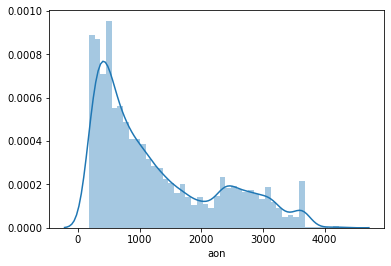

In [28]:
sns.distplot(telecom_data_df['aon'])
plt.show()

### Lets validate the dataset now

In [29]:
telecom_data_df.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 7 to 99997
Data columns (total 64 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   arpu_8                     29979 non-null  float64
 1   onnet_mou_8                29979 non-null  float64
 2   offnet_mou_8               29979 non-null  float64
 3   roam_og_mou_8              29979 non-null  float64
 4   loc_og_t2t_mou_8           29979 non-null  float64
 5   loc_og_t2m_mou_8           29979 non-null  float64
 6   loc_og_t2f_mou_8           29979 non-null  float64
 7   loc_og_t2c_mou_8           29979 non-null  float64
 8   loc_og_mou_8               29979 non-null  float64
 9   std_og_t2t_mou_8           29979 non-null  float64
 10  std_og_t2m_mou_8           29979 non-null  float64
 11  std_og_t2f_mou_8           29979 non-null  float64
 12  std_og_mou_8               29979 non-null  float64
 13  isd_og_mou_8               29979 non-null  flo

### Lets visulize the one by one feature with churn/non churn to see the impact of each feature

In [30]:
def plot_box_chart(attribute):
    plt.figure(figsize=(20,10))
    df = telecom_data_df
    plt.subplot(2,3,1)
    sns.boxplot(data=df, y=attribute+"_good_phase",x="churn",hue="churn",
                showfliers=False,palette=("Set3"))    
    
    plt.subplot(2,3,3)
    sns.boxplot(data=df, y=attribute+"_8",x="churn",hue="churn",
                showfliers=False,palette=("Set3"))
    plt.show()

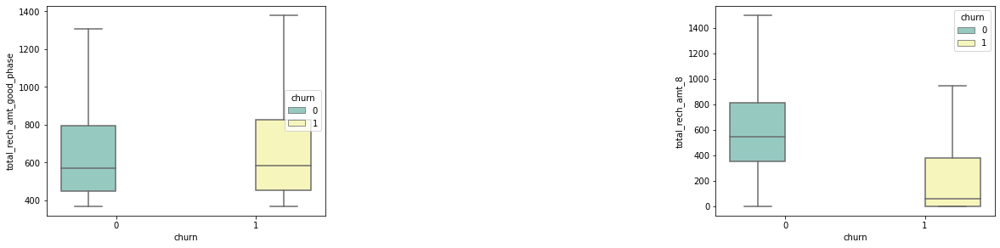

In [31]:
plot_box_chart('total_rech_amt')

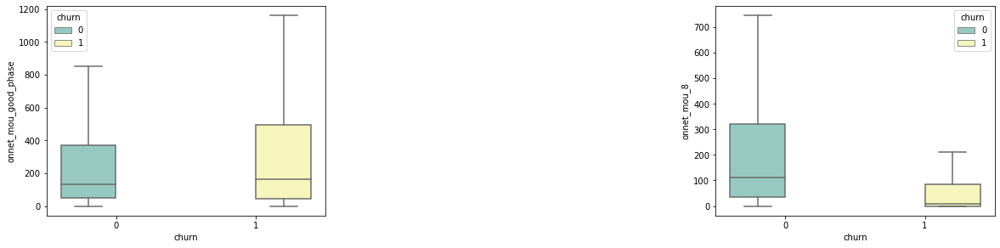

In [32]:
plot_box_chart('onnet_mou')

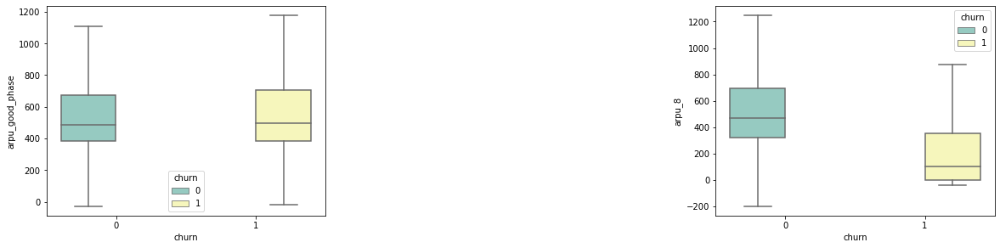

In [33]:
plot_box_chart('arpu')

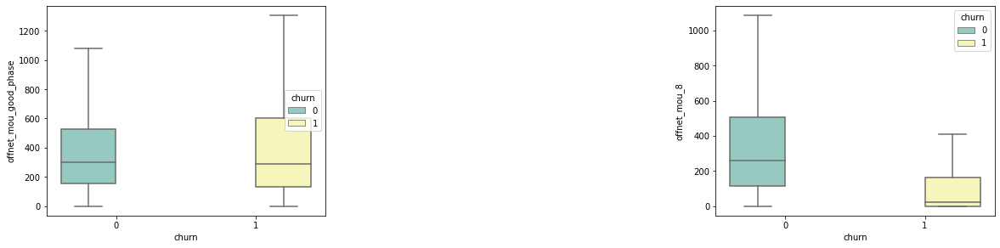

In [34]:
plot_box_chart('offnet_mou')

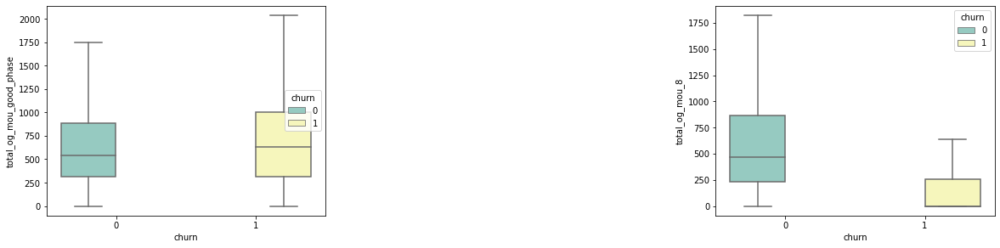

In [35]:
plot_box_chart('total_og_mou')

In [36]:
# Install imblearn if not there by uncommentting below step and run
#!pip install imblearn

# Remove column based upon correlation > 0.8 

In [37]:
telecom_data_df.corr()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,...,loc_og_t2f_mou_good_phase,loc_og_t2c_mou_good_phase,std_og_t2t_mou_good_phase,std_og_t2m_mou_good_phase,std_og_t2f_mou_good_phase,og_others_good_phase,monthly_2g_good_phase,sachet_2g_good_phase,monthly_3g_good_phase,sachet_3g_good_phase
arpu_8,1.000000,0.314904,0.493180,0.186775,0.151811,0.311890,0.135782,0.055814,0.304530,0.254001,...,0.108702,0.013623,0.105110,0.130305,0.053440,0.015746,0.006604,-0.013719,0.157127,0.030460
onnet_mou_8,0.314904,1.000000,0.069352,0.077364,0.457568,0.000182,-0.039430,0.069457,0.290996,0.857370,...,-0.056195,0.038146,0.622618,0.027561,-0.034765,0.009556,-0.081740,-0.027633,-0.075519,-0.023486
offnet_mou_8,0.493180,0.069352,1.000000,0.110908,0.061958,0.448992,0.087961,0.065213,0.332175,0.040688,...,0.060500,0.034151,-0.034361,0.560985,0.036132,0.007839,-0.052557,-0.038140,-0.056366,-0.038024
roam_og_mou_8,0.186775,0.077364,0.110908,1.000000,-0.024314,-0.052876,-0.022848,0.003558,-0.050708,-0.003382,...,0.003311,-0.000596,0.029836,0.048435,0.011773,0.028313,-0.018661,-0.020857,0.009641,-0.010666
loc_og_t2t_mou_8,0.151811,0.457568,0.061958,-0.024314,1.000000,0.193211,0.054888,0.016074,0.767267,-0.050625,...,0.040225,0.006316,-0.078345,-0.073982,-0.000339,0.000629,0.001332,0.006218,-0.001637,-0.008711
loc_og_t2m_mou_8,0.311890,0.000182,0.448992,-0.052876,0.193211,1.000000,0.196960,0.006136,0.775246,-0.103242,...,0.165656,-0.013725,-0.167144,-0.120604,0.043903,-0.002005,0.017862,-0.028365,0.009991,-0.023289
loc_og_t2f_mou_8,0.135782,-0.039430,0.087961,-0.022848,0.054888,0.196960,1.000000,-0.007704,0.216505,-0.073202,...,0.760446,-0.012730,-0.101613,-0.090635,0.114029,-0.016911,0.029079,-0.046723,0.033153,-0.019974
loc_og_t2c_mou_8,0.055814,0.069457,0.065213,0.003558,0.016074,0.006136,-0.007704,1.000000,0.013800,0.069603,...,-0.011429,0.476478,0.051631,0.030226,-0.007902,0.022821,-0.010162,0.024675,-0.014154,0.029934
loc_og_mou_8,0.304530,0.290996,0.332175,-0.050708,0.767267,0.775246,0.216505,0.013800,1.000000,-0.102602,...,0.173843,-0.005450,-0.162862,-0.129647,0.034201,-0.001815,0.013901,-0.016767,0.007181,-0.021601
std_og_t2t_mou_8,0.254001,0.857370,0.040688,-0.003382,-0.050625,-0.103242,-0.073202,0.069603,-0.102602,1.000000,...,-0.084863,0.040000,0.744344,0.073786,-0.039293,0.011088,-0.091422,-0.033145,-0.085189,-0.020574


In [38]:
cor_matrix = telecom_data_df.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
print(to_drop)
telecom_data_df.drop(to_drop,axis= 1,inplace=True)

['std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'total_og_mou_8', 'total_rech_amt_8', 'loc_og_mou_good_phase', 'isd_og_mou_good_phase', 'total_og_mou_good_phase', 'total_ic_mou_good_phase', 'total_rech_amt_good_phase', 'loc_og_t2t_mou_good_phase', 'std_og_t2t_mou_good_phase', 'std_og_t2m_mou_good_phase']


### Lets visualize the data imbalance before applying SMOTE Technique

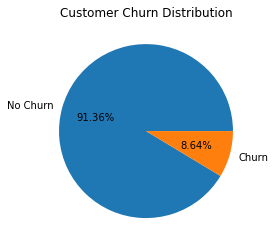

In [39]:
y_train = telecom_data_df.pop('churn')
X_train = telecom_data_df
plt.pie(list(y_train.value_counts()),labels=['No Churn','Churn'],autopct = "%.2f%%")
plt.title('Customer Churn Distribution')
plt.show()

### Devide dataset to train and test using train_test_split

In [40]:
X_train, X_test, y_train,y_test = train_test_split(X_train, y_train,train_size = 0.8,random_state = 42,stratify=y_train)

# Dealing with imbalance data
### Smot technique to handle imbalance data, it will create additional records for churn cases to fix the data imbalance so that model can predict correctly

### Apply SMOTE technique to balance data and visualize the data distribution for both values

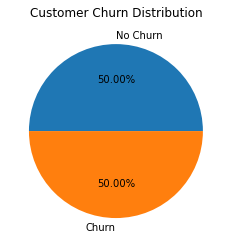

In [41]:
sm = SMOTE()
X_train, y_train = sm.fit_sample(X_train,y_train)
plt.pie(list(y_train.value_counts()),labels=['No Churn','Churn'],autopct = "%.2f%%")
plt.title('Customer Churn Distribution')
plt.show()

### Scaling the feature which is mandatory step before applying PCA

In [42]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Creating PCA and getting principal components

In [43]:
pca = PCA(random_state=42)

In [44]:
pca.fit(X_train)

PCA(random_state=42)

In [45]:
pca.components_

array([[ 2.82663671e-01,  8.47008454e-02,  1.57644332e-01, ...,
         1.08624423e-02,  2.04891446e-01,  4.67385019e-02],
       [ 2.15446897e-01,  2.62558027e-01,  2.77926391e-01, ...,
         1.68312978e-02, -1.84413107e-01, -2.89550127e-02],
       [ 6.19578571e-03,  5.65384592e-02, -3.05831617e-02, ...,
         2.05114736e-01,  1.49099468e-01,  1.97599035e-01],
       ...,
       [-2.35792644e-02, -2.11608731e-02,  2.93332687e-02, ...,
         3.86082143e-03, -3.39543034e-05, -7.63672503e-04],
       [-2.48563918e-03, -4.90483577e-01, -5.07258037e-01, ...,
         3.06836655e-05,  2.05736397e-04, -5.96202514e-05],
       [ 2.08557583e-06,  1.24682215e-05,  1.29113625e-05, ...,
        -7.58947823e-08,  2.51576732e-07,  1.47890210e-07]])

In [46]:
# Getting the explained_variance_ratio
pca.explained_variance_ratio_

array([1.24165045e-01, 9.24448970e-02, 7.06391943e-02, 5.83585270e-02,
       4.34109430e-02, 4.12365387e-02, 3.75708814e-02, 3.61625298e-02,
       3.33105618e-02, 2.92225343e-02, 2.76598344e-02, 2.54211206e-02,
       2.37173182e-02, 2.27448135e-02, 2.21252716e-02, 1.99498295e-02,
       1.80524969e-02, 1.73946186e-02, 1.67776535e-02, 1.59997196e-02,
       1.52206088e-02, 1.45387546e-02, 1.41303246e-02, 1.34313332e-02,
       1.30691163e-02, 1.25161969e-02, 1.20517570e-02, 1.15763256e-02,
       1.15311937e-02, 1.07145033e-02, 9.06895221e-03, 8.64047895e-03,
       7.63153778e-03, 7.07589145e-03, 6.92828679e-03, 6.46892591e-03,
       5.73722502e-03, 5.48338282e-03, 4.99510738e-03, 4.80915211e-03,
       4.60412041e-03, 4.31832665e-03, 4.13657644e-03, 4.01756194e-03,
       3.91965309e-03, 3.31582742e-03, 1.85318872e-03, 1.55895598e-03,
       2.89725830e-04, 2.67975617e-06, 3.21406512e-12])

### Let's visulaize the Cumulative variance to the 95% variance

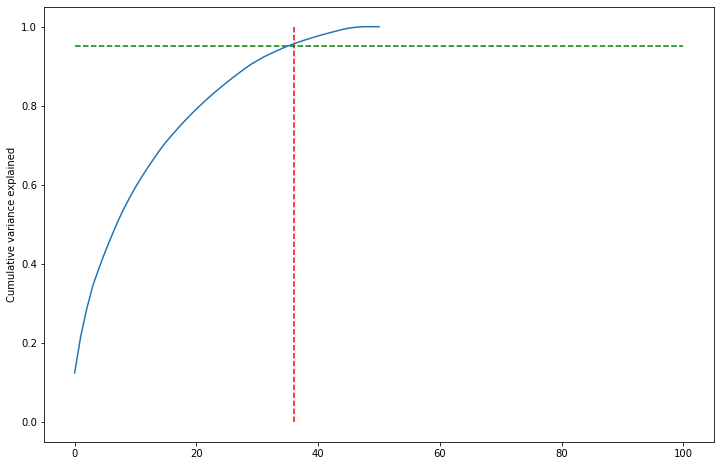

In [47]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
fig = plt.figure(figsize=[12,8])
plt.vlines(x=36, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=100, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

### Let's do the PCA with 95% variance and 30 components

In [48]:
from sklearn.decomposition import IncrementalPCA

In [49]:
pca_final = IncrementalPCA(n_components=36)

In [50]:
X_train_pca = pca_final.fit_transform(X_train)

In [51]:
X_train_pca.shape

(43824, 36)

### Let's visualize the correlation matrix after PCA

In [52]:
corrmat = np.corrcoef(X_train_pca.transpose())

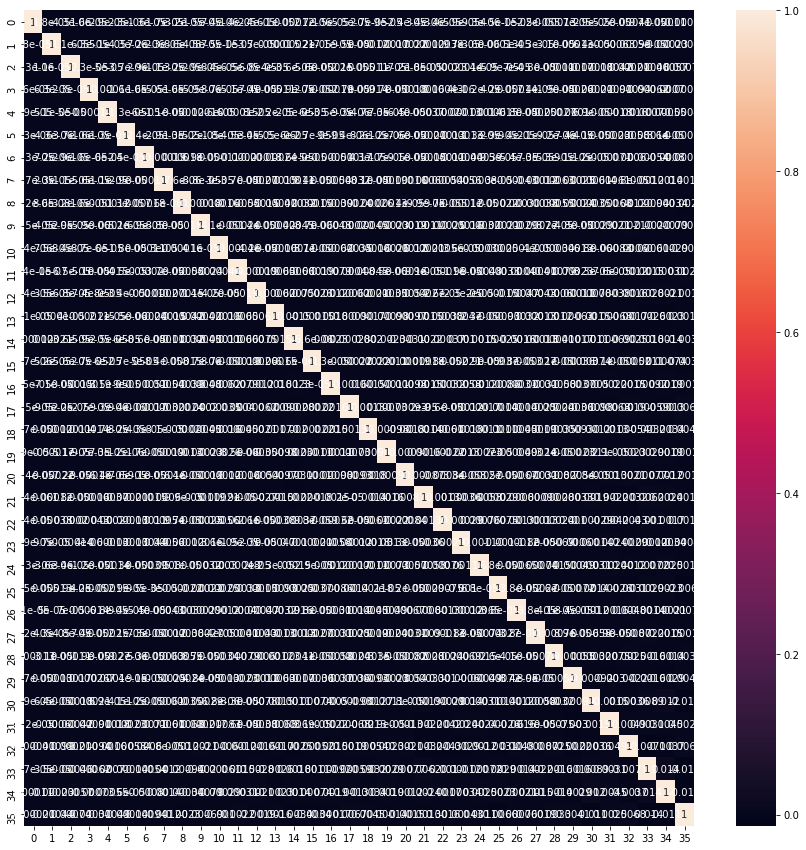

In [53]:
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)
plt.show()

In [54]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(5996, 36)

# Applying logistic regression on the data on our Principal components

In [55]:
learner_pca = LogisticRegression()

In [56]:
model_pca = learner_pca.fit(X_train_pca, y_train)

### Let's look at the roc curve on PCA with logistics regression

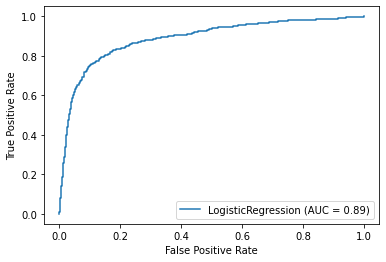

In [57]:
metrics.plot_roc_curve(learner_pca, X_test_pca, y_test)  
plt.show()  

In [58]:
y_pred_test = model_pca.predict_proba(X_test_pca)[:,1]

In [59]:
print('AUC on test data by LogisticRegression =', metrics.roc_auc_score(y_true=y_test, y_score=y_pred_test))

AUC on test data by LogisticRegression = 0.8873493271083633


In [60]:
y_pred_test = model_pca.predict_proba(X_test_pca)[:,1]

In [61]:
def find_best_threshold( y_preds, y_data):
    def single_test(initial_weight):
        y_preds_copy = copy.deepcopy(y_preds)
        y_preds_copy[y_preds_copy > initial_weight] = 1
        y_preds_copy[y_preds_copy <= initial_weight] = 0
        f1_score_v = metrics.f1_score(y_data, y_preds_copy, average='macro')
        f1_score_ret = 1 - f1_score_v
        del y_preds_copy
        return f1_score_ret
    bounds = [(0.0001, .9999)]
    best_weight = differential_evolution(single_test, bounds)
    return best_weight.x[0]

In [62]:
best_thershold = find_best_threshold( y_pred_test, y_test)
print(best_thershold)

0.7920812155621816


In [63]:
y_pred_test[y_pred_test > best_thershold] = 1
y_pred_test[y_pred_test <= best_thershold] = 0

### Let's print the summary of logistics regression model after PCA

In [64]:
print(metrics.confusion_matrix(y_pred_test,y_test))
print(metrics.f1_score(y_pred_test,y_test, average='macro'))
#print(metrics.classification_report(y_pred_test,y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

[[5219  200]
 [ 259  318]]
0.7693501164704122
Sensitivity: 	0.61
Specificity: 	0.95


# Applying xgboost on the data on our Principal components

In [65]:
xgclf = xgb.XGBClassifier()
xgclf.fit(X_train_pca, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [66]:
y_pred_test = xgclf.predict_proba(X_test_pca)[:, 1]
best_thershold = find_best_threshold( y_pred_test, y_test)
print(best_thershold)

0.7811095109776365


### Let's see the AUC on XGBoost 

In [67]:
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,y_score=y_pred_test))

AUC on test data by XGBoost = 0.8747284681019621


### Let's geneate the summary after XGBoost default parameters

In [68]:
y_pred_test[y_pred_test > best_thershold] = 1
y_pred_test[y_pred_test <= best_thershold] = 0
print(metrics.confusion_matrix(y_pred_test,y_test))
print('f1_score : ', metrics.f1_score(y_pred_test,y_test, average='macro'))
#print(metrics.classification_report(y_pred_test,y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

[[5272  239]
 [ 206  279]]
f1_score :  0.7579179832420111
Sensitivity: 	0.54
Specificity: 	0.96


### Let's tune the hyper parameters for XGBoost

In [69]:
%%time
xgb_model = xgb.XGBClassifier()
{'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100}
# Default-Run of default-hyperparameters
parameters = {'learning_rate': [ 0.2, 0.3, 0.4],
              'max_depth': [4, 6, 8],
              #'min_child_weight': [3,4,5],
              'n_estimators': [80,100,120]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = model_selection.GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=3,
                                       scoring='recall',
                                       refit=True)


clf_xgb.fit(X_train_pca, y_train)

Wall time: 3min 40s


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

### Print the best parameters/ score/ estimators

In [70]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.3, 'max_depth': 8, 'n_estimators': 120}
0.9714768163563344
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=8,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=120, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [71]:
y_pred_test = clf_xgb.predict_proba(X_test_pca)[:, 1]
best_thershold = find_best_threshold( y_pred_test, y_test)
print(best_thershold)

0.686853289129568


### Let's print the summary after tuning the hyper parameters

In [72]:
y_pred_test[y_pred_test > best_thershold] = 1
y_pred_test[y_pred_test <= best_thershold] = 0
print(metrics.confusion_matrix(y_pred_test,y_test))
print('f1_score : ', metrics.f1_score(y_pred_test,y_test, average='macro'))
#print(metrics.classification_report(y_pred_test,y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

[[5228  221]
 [ 250  297]]
f1_score :  0.75732112083133
Sensitivity: 	0.57
Specificity: 	0.95


# Start analysis witout PCA to know the important features

### Now lets get the list of important features first applying Logistics Regression without PCA
### Generating the Logistics Regression Model with 40 features using RFE

In [73]:
from sklearn.feature_selection import RFE
model_log = LogisticRegression()
rfe = RFE(model_log,40)
rfe.fit(X_train , y_train)

RFE(estimator=LogisticRegression(), n_features_to_select=40)

In [74]:
rfe.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True, False,  True,  True,  True,  True,  True,  True,
       False, False, False,  True,  True,  True,  True,  True, False,
        True, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True,  True,  True,  True])

### Getting the list of columns after applying RFE

In [75]:
rfe_features = list(telecom_data_df.columns[rfe.support_])
print('Features Identified by RFE \n', rfe_features)

Features Identified by RFE 
 ['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8', 'total_ic_mou_8', 'total_rech_num_8', 'max_rech_amt_8', 'last_day_rch_amt_7', 'last_day_rch_amt_8', 'vol_3g_mb_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8', 'aon', 'sep_vbc_3g', 'days_from_last_rech', 'arpu_good_phase', 'onnet_mou_good_phase', 'offnet_mou_good_phase', 'std_og_mou_good_phase', 'total_rech_num_good_phase', 'max_rech_amt_good_phase', 'loc_og_t2m_mou_good_phase', 'loc_og_t2f_mou_good_phase', 'og_others_good_phase', 'monthly_2g_good_phase', 'sachet_2g_good_phase', 'monthly_3g_good_phase', 'sachet_3g_good_phase']


### Generating the Logistics Regression model with 40 features given by RFE

In [76]:
X_train = pd.DataFrame(data = X_train).iloc[:, rfe.support_]
X_train.columns = list(telecom_data_df.columns[rfe.support_])

X_test = pd.DataFrame(data = X_test).iloc[:, rfe.support_]
X_test.columns = list(telecom_data_df.columns[rfe.support_])

In [77]:
lr = stats.Logit(list(y_train),X_train)
lr_model = lr.fit()
print(lr_model.summary())

         Current function value: 3.299164
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                43824
Model:                          Logit   Df Residuals:                    43784
Method:                           MLE   Df Model:                           39
Date:                Sat, 20 Mar 2021   Pseudo R-squ.:                  -3.760
Time:                        19:02:32   Log-Likelihood:            -1.4458e+05
converged:                      False   LL-Null:                       -30376.
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
arpu_8                       -1.0934      0.117     -9.325      0.000      -1.323      -0.864
onnet_mou_8         

# Use P value and VIF to reduce columns

In [78]:
def get_higest_p_value_column():    
    lr = stats.Logit(list(y_train),X_train)
    lr_model = lr.fit()
    max_p_value = 0
    max_index = 0 
    for index,p_value in enumerate(lr_model.pvalues):        
        if p_value > max_p_value and p_value > 0.05:
            max_p_value = p_value
            max_index = index            
    
    return X_train.columns[max_index],max_p_value

In [79]:
def get_VIF_top_column():
    vif = pd.DataFrame()
    vif['Features'] = X_train.columns
    vif['VIF'] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
    vif = vif.sort_values(by = 'VIF',ascending = False)
    if vif.iloc[0][1] > 5:
        return vif.iloc[0][0],vif.iloc[0][1]
    else:
        return 'None',0

In [80]:
def remove_column_using_p_value():
    while True:
        col,p_value = get_higest_p_value_column()
        if p_value == 0:
            break        
        print('Found ' + col + ' with p_value as ' + str(p_value) + ' and removing this column.')
        X_train.drop(col,axis = 1,inplace=True)
        X_test.drop(col,axis = 1,inplace=True)

In [81]:
while True:
    remove_column_using_p_value()
    col,vif = get_VIF_top_column()
    if col == 'None':
        remove_column_using_p_value()
        break
    print('Found VIF : ' + str(vif) +' for column ' + col  + ' and remove this column from train and test.')
    X_train = X_train.drop(col,axis = 1)
    X_test = X_test.drop(col,axis = 1) 
    
    

         Current function value: 3.299164
         Iterations: 35
Found VIF : 3415909227.16564 for column loc_og_mou_8 and remove this column from train and test.
Optimization terminated successfully.
         Current function value: 0.397571
         Iterations 9
Found spl_og_mou_8 with p_value as 0.7373113791047273 and removing this column.
Optimization terminated successfully.
         Current function value: 0.397572
         Iterations 9
Found loc_og_t2f_mou_8 with p_value as 0.36187225213286345 and removing this column.
Optimization terminated successfully.
         Current function value: 0.397581
         Iterations 9
Found og_others_8 with p_value as 0.3229248807107826 and removing this column.
Optimization terminated successfully.
         Current function value: 0.397611
         Iterations 8
Found max_rech_amt_8 with p_value as 0.22125178694699266 and removing this column.
Optimization terminated successfully.
         Current function value: 0.397628
         Iterations 8


# Implement Xgboost

In [82]:
xgclf = xgb.XGBClassifier()
xgclf.fit(X_train, y_train)

y_pred_test = xgclf.predict_proba(X_test)[:, 1]
best_thershold = find_best_threshold( y_pred_test, y_test)
print(best_thershold)

y_pred_test[y_pred_test > best_thershold] = 1
y_pred_test[y_pred_test <= best_thershold] = 0
print(metrics.confusion_matrix(y_pred_test,y_test))
print('f1_score : ', metrics.f1_score(y_pred_test,y_test, average='macro'))
#print(metrics.classification_report(y_pred_test,y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

0.37514228524299925
[[5196  158]
 [ 282  360]]
f1_score :  0.7900346355625731
Sensitivity: 	0.69
Specificity: 	0.95


# Support Vector Machine

In [83]:
from sklearn.svm import SVC

In [84]:
model_svc = SVC(C = 1, kernel='rbf')
model_svc.fit(X_train, y_train)
y_pred_test = model_svc.predict(X_test)

In [85]:
print('Accuracy Score is :', metrics.accuracy_score(y_pred_test, y_test)*100)
print('confusion matrix \n', metrics.confusion_matrix(y_pred_test, y_test), '\n')
#print(metrics.classification_report(y_pred_test, y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy Score is : 87.69179452968646
confusion matrix 
 [[4855  115]
 [ 623  403]] 

Sensitivity: 	0.78
Specificity: 	0.89


In [86]:
print(metrics.f1_score(y_pred_test, y_test,average='macro'))

0.72569259852891


### Grid Search to Find Optimal Hyperparameters  for SVC
### Commented out as it's taking lot of time

Let's first use the RBF kernel to find the optimal C and gamma (we can consider the kernel as a hyperparameter as well, though training the model will take an exorbitant amount of time).

In [87]:
# # creating a KFold object with 5 splits 
# folds = KFold(n_splits = 3, shuffle = True, random_state = 42)

# # specify range of hyperparameters
# # Set the parameters by cross-validation
# hyper_params = [ {'C': [1, 10 ]}]


# # specify model
# model_svc = SVC(kernel="rbf")

# # set up GridSearchCV()
# model_svc = GridSearchCV(estimator = model_svc, 
#                         param_grid = hyper_params, 
#                         scoring = 'recall_score', 
#                         cv = folds, 
#                         verbose = 1,
#                         return_train_score=True)      



In [88]:
# %%time
# # fit the model
# model_svc.fit(X_train, y_train)  

In [89]:
# y_pred_test = model_svc.predict(X_test)
# print('Accuracy Score is :', metrics.accuracy_score(y_pred_test, y_test)*100)
# print('confusion matrix \n', metrics.confusion_matrix(y_pred_test, y_test), '\n')
# #print(metrics.classification_report(y_pred_test, y_test))
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred_test, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# Decision Tree

### Lets create Decision Tree with default parameter and see how it is performing

### Creating the methods to display and summarise the result

In [90]:
# creating method get_dt_graph to generate the tree graph
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_train.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [91]:
# creating method to evaluate the tree model and display accuracy, confusion matrix and classification report
# to evaulate the model
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))
    print('f1_score : ', metrics.f1_score(y_test, dt_classifier.predict(X_test)))
    
    sensitivity, specificity, _ = sensitivity_specificity_support(y_test, dt_classifier.predict(X_test), average='binary')
    print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

In [92]:
model_dt = DecisionTreeClassifier(random_state=42)

### lets fit the data with default decision tree classifier

In [93]:
model_dt.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

### Lets print the tree with default parameters

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.22325 to fit



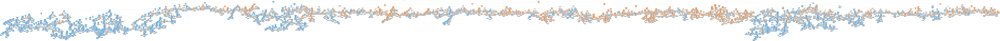

In [94]:
gph = get_dt_graph(model_dt)
Image(gph.create_png())

### Lets evaulate the default model

In [95]:
evaluate_model(model_dt)

Train Accuracy : 1.0
Train Confusion Matrix:
[[21912     0]
 [    0 21912]]
--------------------------------------------------
Test Accuracy : 0.8754169446297532
Test Confusion Matrix:
[[4931  547]
 [ 200  318]]
f1_score :  0.4598698481561822
Sensitivity: 	0.61
Specificity: 	0.9


### Hyper-parameter tuning to get the best Decision Tree parameters

In [96]:
# Define the list of parameters need to be used
params = {
    'max_depth': [4, 6,7, 8,9, 10,12,14],
    'min_samples_leaf': [5,6,7,8,9, 10,11,12,13,14,15, 20, 50]
}

In [97]:
model_dt = DecisionTreeClassifier(random_state=42)

### Figure out the best parameters using teh GridSearchCV

In [98]:
%%time
grid_search = GridSearchCV(estimator=model_dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "recall")

Wall time: 0 ns


### Lets fit the grid search model to figure out best model

In [99]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 104 candidates, totalling 416 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 416 out of 416 | elapsed:   20.0s finished


Wall time: 20.9 s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [4, 6, 7, 8, 9, 10, 12, 14],
                         'min_samples_leaf': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                              15, 20, 50]},
             scoring='recall', verbose=1)

In [100]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.265995,0.008515,0.012251,0.006797,4,5,"{'max_depth': 4, 'min_samples_leaf': 5}",0.826214,0.880796,0.876415,0.878788,0.865553,0.022765,93
1,0.268748,0.006608,0.010250,0.002277,4,6,"{'max_depth': 4, 'min_samples_leaf': 6}",0.826214,0.880796,0.876415,0.878788,0.865553,0.022765,93
2,0.265000,0.009165,0.009499,0.000499,4,7,"{'max_depth': 4, 'min_samples_leaf': 7}",0.826214,0.880796,0.876415,0.878788,0.865553,0.022765,93
3,0.320745,0.058836,0.008249,0.000433,4,8,"{'max_depth': 4, 'min_samples_leaf': 8}",0.826214,0.880796,0.876415,0.878788,0.865553,0.022765,93
4,0.261993,0.012104,0.008500,0.000500,4,9,"{'max_depth': 4, 'min_samples_leaf': 9}",0.826214,0.880796,0.876415,0.878788,0.865553,0.022765,93


### Let see the best score after hyper tuning 

In [101]:
grid_search.best_score_

0.9230558598028478

### Lets get the best model and assign it to dt_best

In [102]:
model_dt_best = grid_search.best_estimator_

### Lets print the tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.33264 to fit



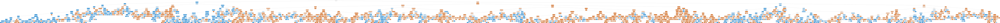

In [103]:
gph = get_dt_graph(model_dt_best)
Image(gph.create_png())

### Let's evaluate the best Decision Tree Model

In [104]:
evaluate_model(model_dt_best)

Train Accuracy : 0.9514421321650237
Train Confusion Matrix:
[[20542  1370]
 [  758 21154]]
--------------------------------------------------
Test Accuracy : 0.8772515010006671
Test Confusion Matrix:
[[4881  597]
 [ 139  379]]
f1_score :  0.5073627844712183
Sensitivity: 	0.73
Specificity: 	0.89


In [105]:
model_dt_best.feature_importances_

array([1.52184858e-02, 9.27026819e-03, 1.98053398e-01, 9.73182803e-03,
       1.25645070e-02, 6.85099832e-03, 2.61915297e-03, 4.27976677e-01,
       3.31471930e-02, 2.13678432e-02, 1.00532186e-01, 1.34232443e-02,
       6.53056122e-03, 5.69166228e-03, 4.40193504e-03, 2.21113540e-04,
       1.72176990e-02, 6.25754608e-03, 5.46827011e-03, 1.60634406e-02,
       1.19626242e-02, 1.11422532e-02, 1.33664272e-02, 1.21396471e-02,
       9.48374263e-03, 1.18060892e-02, 4.36605383e-03, 5.11616389e-03,
       3.99214089e-03, 4.01684757e-03])

### Lets display the important variable predicted by Decision tree model

In [106]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": model_dt_best.feature_importances_})
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
7,total_ic_mou_8,0.427977
2,roam_og_mou_8,0.198053
10,last_day_rch_amt_8,0.100532
8,total_rech_num_8,0.033147
9,last_day_rch_amt_7,0.021368
16,aon,0.017218
19,arpu_good_phase,0.016063
0,onnet_mou_8,0.015218
11,vol_3g_mb_8,0.013423
22,total_rech_num_good_phase,0.013366


# Random Forest

### Lets Try Random Forest to see if we getting nay better result with Random Froest 

### Lets create RandomForestClassifier with n_estimators=10, max_depth=4, max_features=5 and will later tune it

In [107]:
model_rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=42, oob_score=True)

In [108]:
%%time
model_rf.fit(X_train, y_train)

Wall time: 327 ms


RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=42)

In [109]:
model_rf.oob_score_

0.8370755750273823

### Lets plot the roc curve 

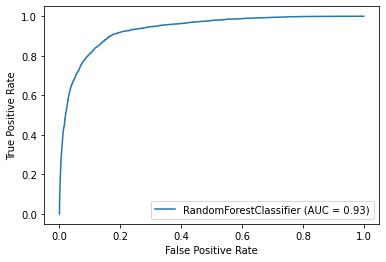

In [110]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(model_rf, X_train, y_train)
plt.show()

## Random Forest Hyperparameter Tuning

In [111]:
# Lets try with below params 
params = {
    'max_depth': [10,20,25],
    'min_samples_leaf': [3,4,5,10],
    'n_estimators': [50, 100,120]
}

### Define GridsearchCV with above params to figure out best parameters

In [112]:
%%time
grid_search = GridSearchCV(estimator=model_rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="recall")

Wall time: 0 ns


### Lets fit the model with gridsearch 

In [113]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 36 candidates, totalling 144 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 144 out of 144 | elapsed:  2.0min finished


Wall time: 2min 10s


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(max_depth=4, max_features=5,
                                              n_estimators=10, oob_score=True,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 25],
                         'min_samples_leaf': [3, 4, 5, 10],
                         'n_estimators': [50, 100, 120]},
             scoring='recall', verbose=1)

### Get the best score after hyper parameter tuning

In [114]:
grid_search.best_score_

0.9495710113179993

### Lets get the best model after hyper parameter tuning

In [115]:
model_rf_best = grid_search.best_estimator_
model_rf_best

RandomForestClassifier(max_depth=20, max_features=5, min_samples_leaf=3,
                       n_estimators=120, oob_score=True, random_state=42)

### Lets plot the roc curve 

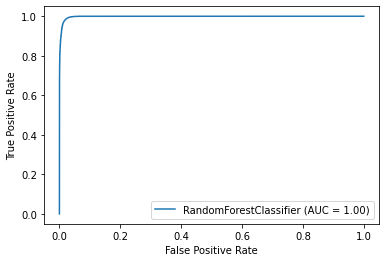

In [116]:
plot_roc_curve(model_rf_best, X_train, y_train)
plt.show()

### Evaluate the Random Forest best model

In [117]:
evaluate_model(model_rf_best)

Train Accuracy : 0.9819733479372034
Train Confusion Matrix:
[[21295   617]
 [  173 21739]]
--------------------------------------------------
Test Accuracy : 0.9217811874583055
Test Confusion Matrix:
[[5151  327]
 [ 142  376]]
f1_score :  0.615888615888616
Sensitivity: 	0.73
Specificity: 	0.94


# Ensemble Xgboost, SVC, Decision tree and random forest model using Average Weighting

In [118]:
y_pred_xg = xgclf.predict(X_test)
y_pred_svc = model_svc.predict(X_test)
y_pred_dt = model_dt_best.predict(X_test)
y_pred_rf = model_rf_best.predict(X_test)
y_preds = []
for i in range(len(y_pred_xg)):
    y_preds.append([y_pred_xg[i],y_pred_svc[i],y_pred_dt[i],y_pred_rf[i]])

In [119]:
new_y_preds = []
for i in range(len(y_preds)):
    new_y_preds.append(np.average(np.asarray(y_preds[i])))
new_y_preds = np.asarray(new_y_preds)
new_y_preds[new_y_preds >= 0.5] = 1
new_y_preds[new_y_preds < 0.5] = 0

f1_score_v = metrics.f1_score(y_test, new_y_preds, average='macro')
print('Accuracy Score is :', metrics.accuracy_score(new_y_preds, y_test)*100)
print('confusion matrix \n', metrics.confusion_matrix(new_y_preds, y_test), '\n')
#print(metrics.classification_report(new_y_preds, y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, new_y_preds, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy Score is : 91.01067378252168
confusion matrix 
 [[5068  129]
 [ 410  389]] 

Sensitivity: 	0.75
Specificity: 	0.93


In [120]:
metrics.f1_score(y_test, new_y_preds, average='macro')

0.7701223595603519

# Ensemble Xgboost, SVC, Decision tree and random forest model using Weighted Average

In [121]:
def find_best_model_weight(y_preds, y_data):
    def find_weight(initial_weight):
        y_preds_copy = copy.deepcopy(y_preds)
        initial_weight /= np.sum(initial_weight)
        new_y_preds = []
        for i in range(len(y_preds)):
            new_y_preds.append(np.sum(np.multiply(np.asarray(y_preds[i]),initial_weight)))        
        #print(new_y_preds)   
        new_y_preds = np.asarray(new_y_preds)
        new_y_preds[new_y_preds > 0.5] = 1
        new_y_preds[new_y_preds <= 0.5] = 0
        
        f1_score_v = metrics.recall_score(y_data, new_y_preds, average='macro')
        f1_score_ret = 1 - f1_score_v
        del y_preds_copy
        return f1_score_ret
    
    bounds = [(0.01, .99),(0.01, .99),(0.01, .99),(0.01, .99)]
    best_ensemble_weight = differential_evolution(find_weight, bounds)
    return best_ensemble_weight

In [122]:
best_ensemble_weight = find_best_model_weight(y_preds,y_test)
best_ensemble_weight

     fun: 0.16499307161957766
 message: 'Optimization terminated successfully.'
    nfev: 310
     nit: 4
 success: True
       x: array([0.05937048, 0.59588814, 0.30970794, 0.62154004])

In [123]:
y_preds_copy = copy.deepcopy(y_preds)
best_ensemble_weight = best_ensemble_weight.x
best_ensemble_weight /= np.sum(best_ensemble_weight)
new_y_preds = []
for i in range(len(y_preds)):
    new_y_preds.append(np.sum(np.multiply(np.asarray(y_preds[i]),best_ensemble_weight)))        
new_y_preds = np.asarray(new_y_preds)
new_y_preds[new_y_preds > 0.5] = 1
new_y_preds[new_y_preds <= 0.5] = 0

f1_score_v = metrics.f1_score(y_test, new_y_preds, average='macro')
print(f1_score_v)

0.7749444620211765


In [124]:
print('Accuracy Score is :', metrics.accuracy_score(new_y_preds, y_test)*100)
print('confusion matrix \n', metrics.confusion_matrix(new_y_preds, y_test), '\n')
#print(metrics.classification_report(new_y_preds, y_test))
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, new_y_preds, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

Accuracy Score is : 91.41094062708473
confusion matrix 
 [[5098  135]
 [ 380  383]] 

Sensitivity: 	0.74
Specificity: 	0.93


### Print the features with thier importance

In [125]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": model_rf_best.feature_importances_
})
imp_df = imp_df.sort_values(by="Imp", ascending=False)
imp_df[:15]

,Varname,Imp
7,total_ic_mou_8,0.156322
2,roam_og_mou_8,0.155524
10,last_day_rch_amt_8,0.090999
4,loc_og_t2m_mou_8,0.088921
3,loc_og_t2t_mou_8,0.073244
1,offnet_mou_8,0.063214
8,total_rech_num_8,0.044679
0,onnet_mou_8,0.040135
9,last_day_rch_amt_7,0.029341
16,aon,0.023185


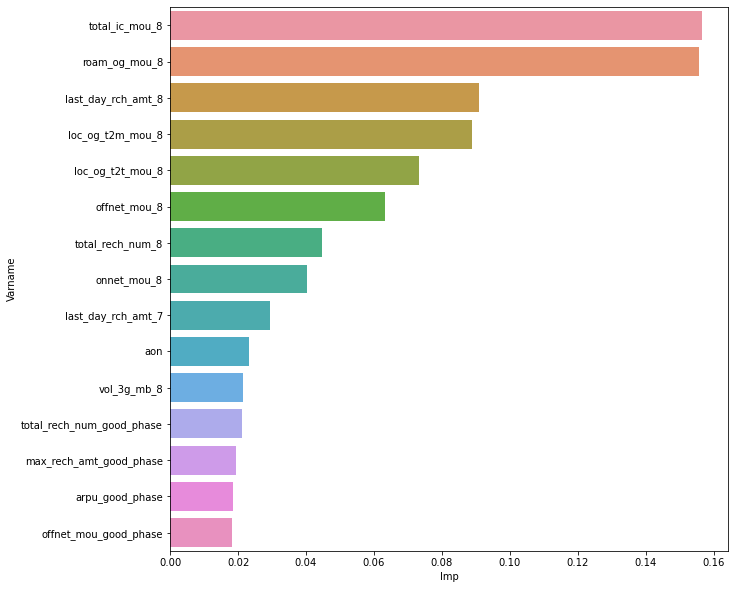

In [126]:
plt.figure(figsize=(10,10))
ax = sns.barplot(x="Imp", y="Varname", data=imp_df[:15])
plt.show()

# Conclusion

# XGBoost
### f1_score :  0.7905832798584427
### Sensitivity: 	0.6
### Specificity: 	0.97

## SVC
### f1_score : 0.7277639385176946
### Sensitivity: 	0.78
### Specificity: 	0.89

## Decision Tree
### f1_score : 0.5143246930422919
### Sensitivity: 	0.73
### Specificity: 	0.9

## Random Forest : 
### f1_score : 0.6182121971595655
### Sensitivity: 	0.71
### Specificity: 	0.94

## Ensemble Xgboost, SVC, Decision tree and random forest model using Average Weighting
### f1_score : 0.7748448836055342
### Sensitivity: 	0.75
### Specificity: 	0.93

## Ensemble Xgboost, SVC, Decision tree and random forest model using Weighted Average
### f1_score : 0.7277639385176946
### Sensitivity: 	0.78
### Specificity: 	0.89

## Important Fetaures
### 	Feature						Importance
### 1.	roam_og_mou_8				0.157270
### 2.	total_ic_mou_8				0.151875
### 3.	last_day_rch_amt_8			0.086483
### 4.	loc_og_t2m_mou_8			0.071409
### 5.	offnet_mou_8				0.063932
### 6.	loc_og_t2t_mou_8			0.063853
### 7.	onnet_mou_8					0.042926
### 8.	total_rech_num_8			0.038854
### 9.	last_day_rch_amt_7			0.028340
### 10.	loc_og_t2f_mou_8			0.023733
### 11.	aon							0.023424
### 12.	vol_3g_mb_8					0.021052
### 13.	last_day_rch_amt_6			0.020583
### 14.	spl_og_mou_8				0.019767
### 15.	total_rech_num_good_phase	0.019474

## Recommendation 
### 1) Reduce the charges for roaming
### 2) Give discount on outgoing calls
### 3) Monitor loast day of recharge, it it's greater than last 40 days then offer some package.
### 4) Take care old customer and provide some promtion scheme time to time.
